Water Potability classification

Importing the libraries

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix

from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
import xgboost as xgb



DATA EXPLORATION

In [ ]:
#Reading a csv file
df = pd.read_csv('/content/drive/MyDrive/water_potability.csv')

In [ ]:
df.head()


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [ ]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB



DATA PRE-PROCESSING (DATA CLEANING)

In [ ]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [ ]:
df

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1


In [ ]:
df['ph'] = df['ph'].fillna(df['ph'].mean())
df['Sulfate'] = df['Sulfate'].fillna(df['Sulfate'].mean())
df['Trihalomethanes'] = df['Trihalomethanes'].fillna(df['Trihalomethanes'].mean())

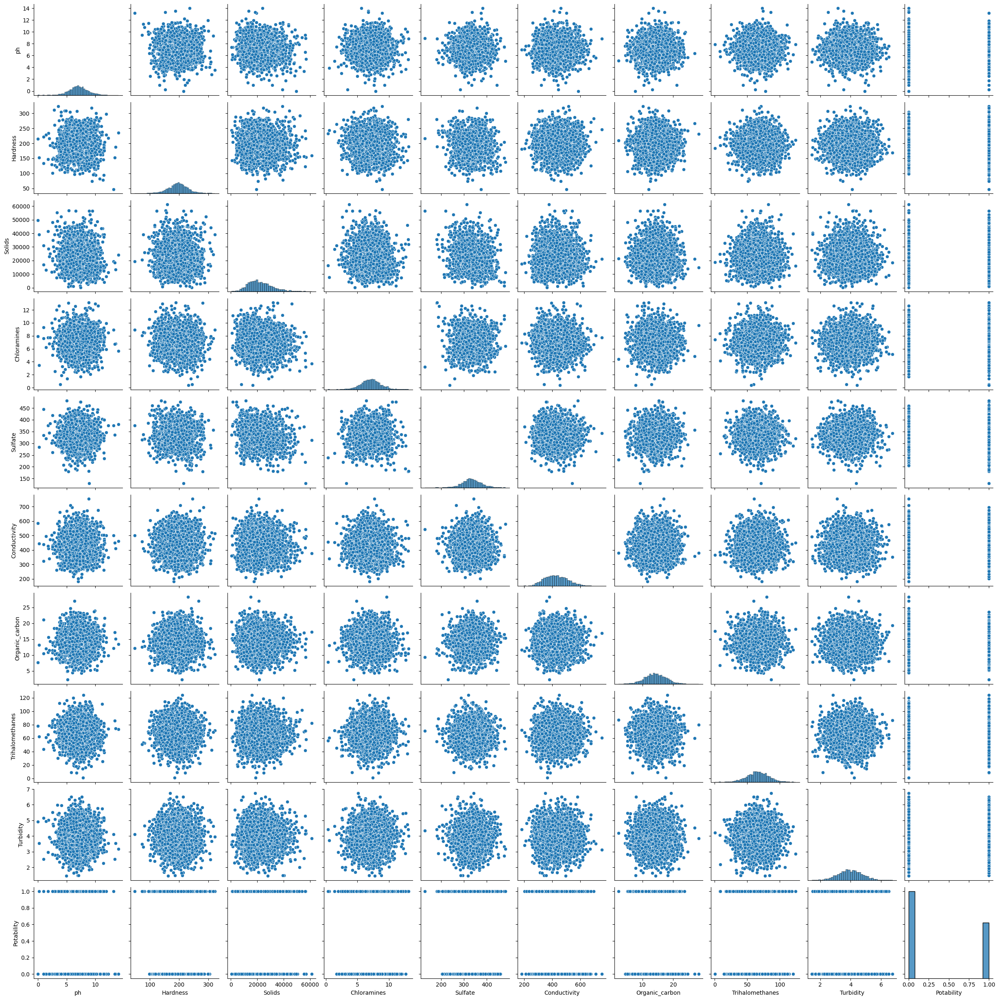

In [ ]:
sns.pairplot(df)

In [ ]:
df.corr().style.background_gradient(cmap='coolwarm')

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
ph,1.000000,0.082096,-0.089288,-0.034350,0.018203,0.018614,0.043503,0.003354,-0.039057,-0.003556
Hardness,0.082096,1.000000,-0.046899,-0.030054,-0.106923,-0.023915,0.003610,-0.013013,-0.014449,-0.013837
Solids,-0.089288,-0.046899,1.000000,-0.070148,-0.171804,0.013831,0.010242,-0.009143,0.019546,0.033743
Chloramines,-0.034350,-0.030054,-0.070148,1.000000,0.027244,-0.020486,-0.012653,0.017084,0.002363,0.023779
Sulfate,0.018203,-0.106923,-0.171804,0.027244,1.000000,-0.016121,0.030831,-0.030274,-0.011187,-0.023577
Conductivity,0.018614,-0.023915,0.013831,-0.020486,-0.016121,1.000000,0.020966,0.001285,0.005798,-0.008128
Organic_carbon,0.043503,0.003610,0.010242,-0.012653,0.030831,0.020966,1.000000,-0.013274,-0.027308,-0.030001
Trihalomethanes,0.003354,-0.013013,-0.009143,0.017084,-0.030274,0.001285,-0.013274,1.000000,-0.022145,0.007130
Turbidity,-0.039057,-0.014449,0.019546,0.002363,-0.011187,0.005798,-0.027308,-0.022145,1.000000,0.001581
Potability,-0.003556,-0.013837,0.033743,0.023779,-0.023577,-0.008128,-0.030001,0.007130,0.001581,1.000000


In [ ]:
df['ph'].describe()

count    2785.000000
mean        7.080795
std         1.594320
min         0.000000
25%         6.093092
50%         7.036752
75%         8.062066
max        14.000000
Name: ph, dtype: float64

In [ ]:
class_count = df['Potability'].value_counts()
print(class_count)

Potability
0    1998
1    1278
Name: count, dtype: int64


In [ ]:
df['Sulfate'].mean()

333.7757766108134

In [ ]:
df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


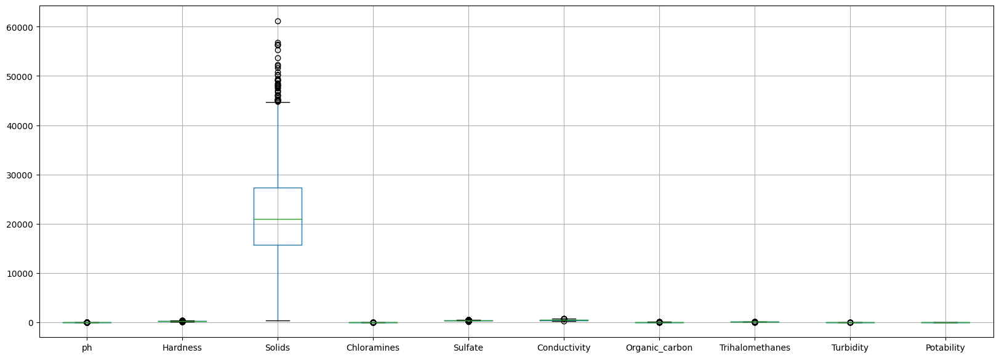

In [ ]:
df.boxplot(figsize=(20,7))
plt.show()

In [ ]:
df['Solids'].describe()

count     3276.000000
mean     22014.092526
std       8768.570828
min        320.942611
25%      15666.690297
50%      20927.833607
75%      27332.762127
max      61227.196008
Name: Solids, dtype: float64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          3276 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [ ]:
df.shape

(3276, 10)

DATA VISUALISATION

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


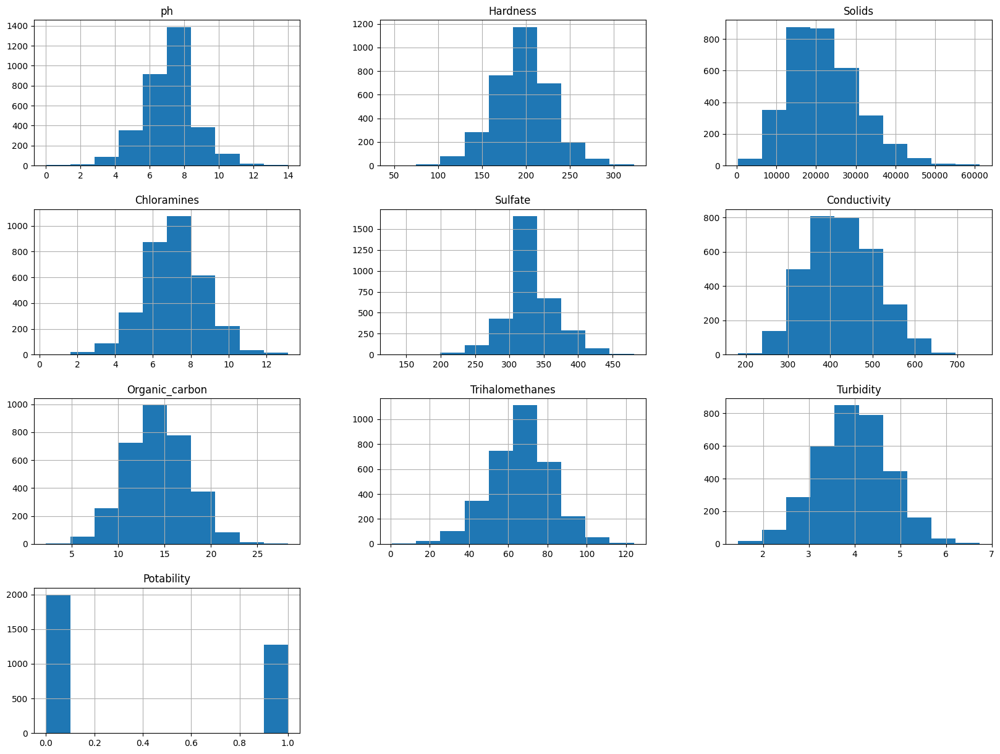

In [ ]:
#Histograms
df.hist(figsize=(20,15))
plt.show()

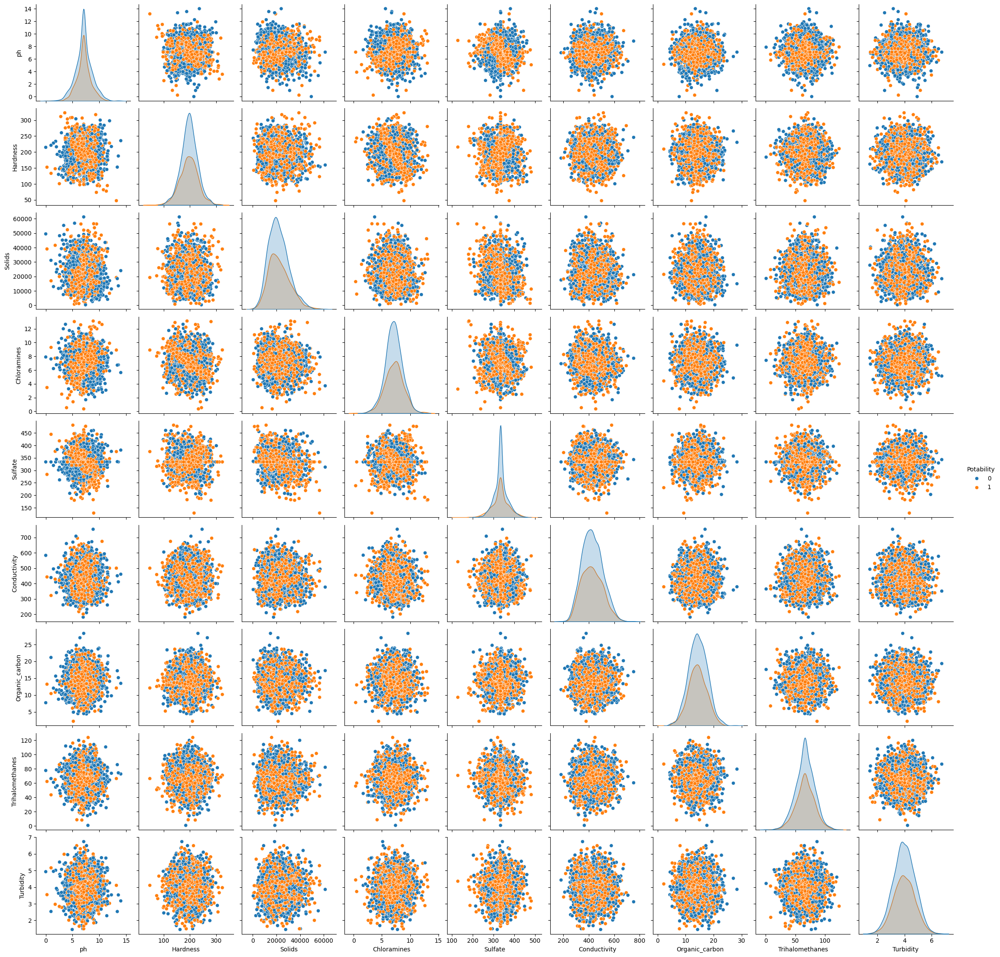

In [ ]:
sns.pairplot(df,hue='Potability')
plt.show()

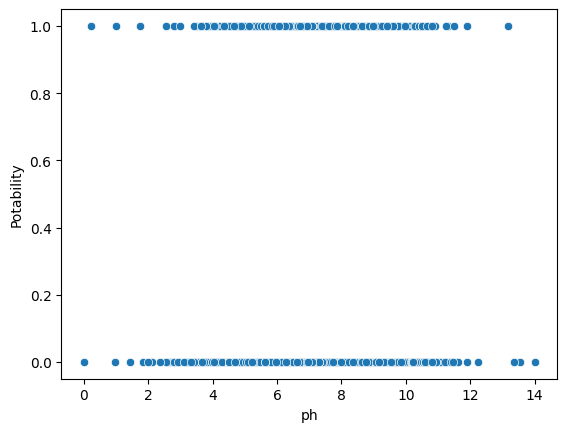

In [ ]:
sns.scatterplot(x=df['ph'], y=df['Potability'])
plt.show()

In [ ]:
X = df.drop('Potability', axis=1)
y = df['Potability']
X_train , X_test , y_train , y_test = train_test_split(X,y , test_size =0.25,random_state=42 )

In [ ]:
df[df['Potability']==1].describe().T.style.background_gradient(subset=['mean','std','50%','count'])

,count,mean,std,min,25%,50%,75%,max
ph,1278.000000,7.074754,1.343955,0.227499,6.351824,7.080795,7.780068,13.175402
Hardness,1278.000000,195.800744,35.547041,47.432000,174.330531,196.632907,218.003420,323.124000
Solids,1278.000000,22383.991018,9101.010208,728.750830,15668.985035,21199.386614,27973.236446,56488.672413
Chloramines,1278.000000,7.169338,1.702988,0.352000,6.094134,7.215163,8.199261,13.127000
Sulfate,1278.000000,332.844122,41.868471,129.000000,313.052947,333.775777,354.807924,481.030642
Conductivity,1278.000000,425.383800,82.048446,201.619737,360.939023,420.712729,484.155911,695.369528
Organic_carbon,1278.000000,14.160893,3.263907,2.200000,12.033897,14.162809,16.356245,23.604298
Trihalomethanes,1278.000000,66.533513,15.971968,8.175876,56.911186,66.396293,77.067457,124.000000
Turbidity,1278.000000,3.968328,0.780842,1.492207,3.430909,3.958576,4.509569,6.494249
Potability,1278.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
df[df['Potability']==0].describe().T.style.background_gradient(subset=['mean','std','50%','count'])

,count,mean,std,min,25%,50%,75%,max
ph,1998.000000,7.084658,1.545490,0.000000,6.224046,7.080795,7.940697,14.000000
Hardness,1998.000000,196.733292,31.057540,98.452931,177.823265,197.123423,216.120687,304.235912
Solids,1998.000000,21777.490788,8543.068788,320.942611,15663.057382,20809.618280,27006.249009,61227.196008
Chloramines,1998.000000,7.092175,1.501045,1.683993,6.155640,7.090334,8.066462,12.653362
Sulfate,1998.000000,334.371700,31.943667,203.444521,319.354715,333.775777,348.316746,460.107069
Conductivity,1998.000000,426.730454,80.047317,181.483754,368.498530,422.229331,480.677198,753.342620
Organic_carbon,1998.000000,14.364335,3.334554,4.371899,12.101057,14.293508,16.649485,28.300000
Trihalomethanes,1998.000000,66.308522,15.642636,0.738000,56.441831,66.396293,76.518849,120.030077
Turbidity,1998.000000,3.965800,0.780282,1.450000,3.444062,3.948076,4.496106,6.739000
Potability,1998.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


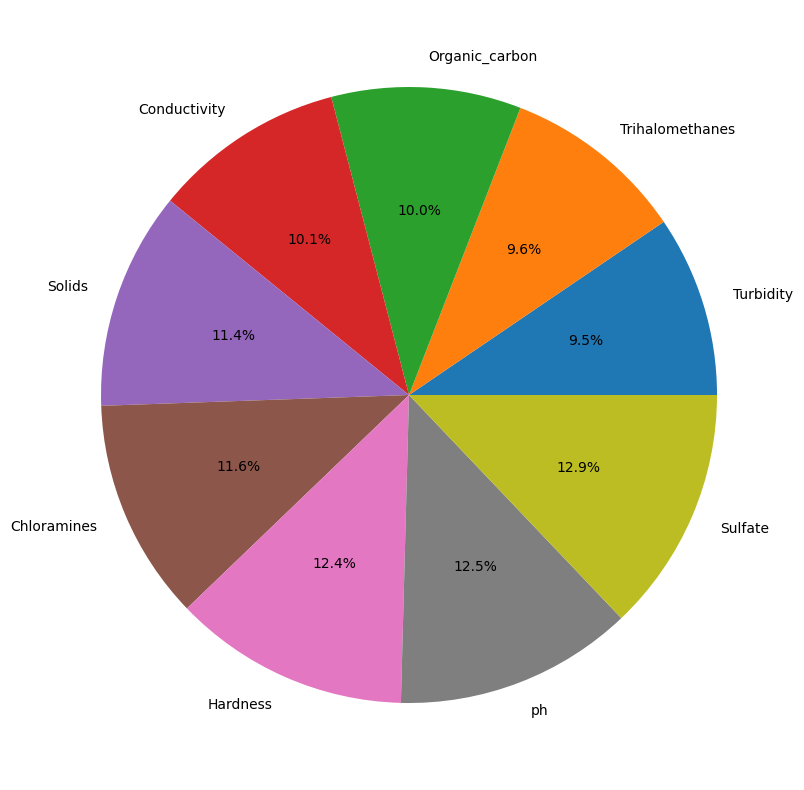

In [ ]:
#Finding out the most important variables
clasification = RandomForestClassifier()
clasification.fit(X,y)

variables = X.columns
importance = pd.DataFrame()

importance['Features'] = variables
importance['Importance'] = clasification.feature_importances_
importance = importance.sort_values(by=['Importance'],ascending=True)

labels = importance['Features']
values = importance['Importance']

plt.figure(figsize=(10,10))
plt.pie(values, labels=labels,autopct='%0.1f%%')
plt.show()

<Axes: xlabel='ph', ylabel='Count'>

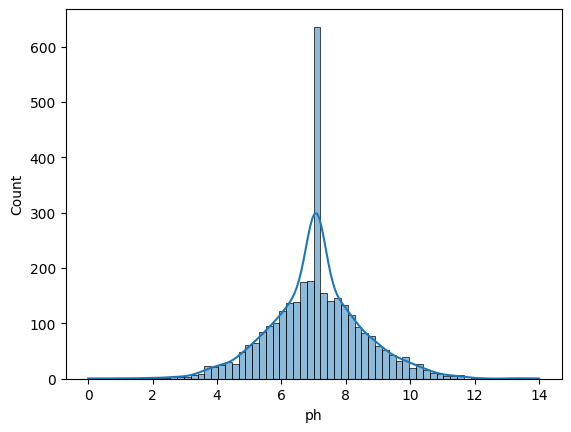

In [ ]:
sns.histplot(df.ph,kde=True)

In [ ]:
df[['ph','Sulfate','Trihalomethanes']].describe().T

,count,mean,std,min,25%,50%,75%,max
ph,3276.0,7.080795,1.469956,0.000,6.277673,7.080795,7.870050,14.000000
Sulfate,3276.0,333.775777,36.142612,129.000,317.094638,333.775777,350.385756,481.030642
Trihalomethanes,3276.0,66.396293,15.769881,0.738,56.647656,66.396293,76.666609,124.000000


<Axes: xlabel='ph', ylabel='Sulfate'>

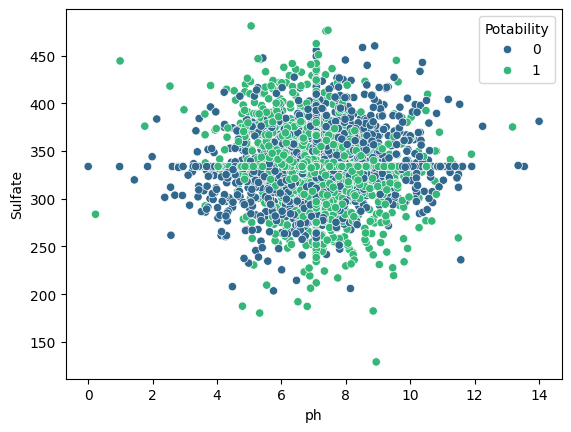

In [ ]:
sns.scatterplot(data = df, x='ph', y='Sulfate', hue='Potability',palette="viridis")

<Axes: xlabel='ph', ylabel='Trihalomethanes'>

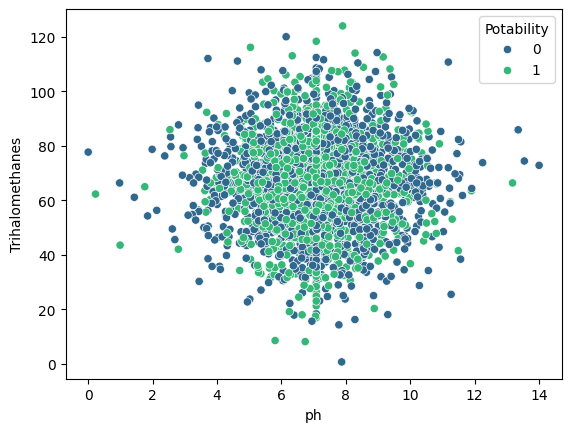

In [ ]:
sns.scatterplot(data = df, x='ph', y='Trihalomethanes', hue='Potability',palette="viridis")

<Axes: xlabel='Trihalomethanes', ylabel='Sulfate'>

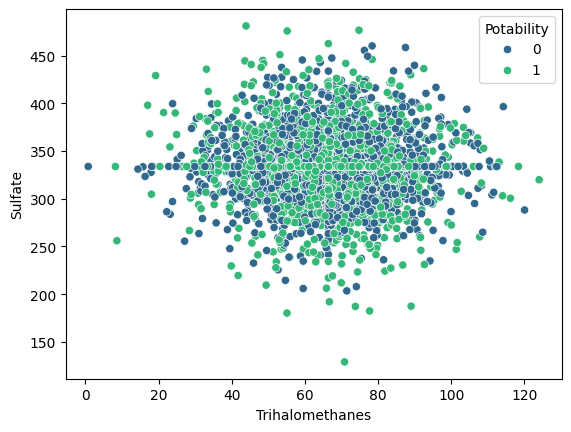

In [ ]:
sns.scatterplot(data = df, x='Trihalomethanes', y='Sulfate', hue='Potability',palette="viridis")

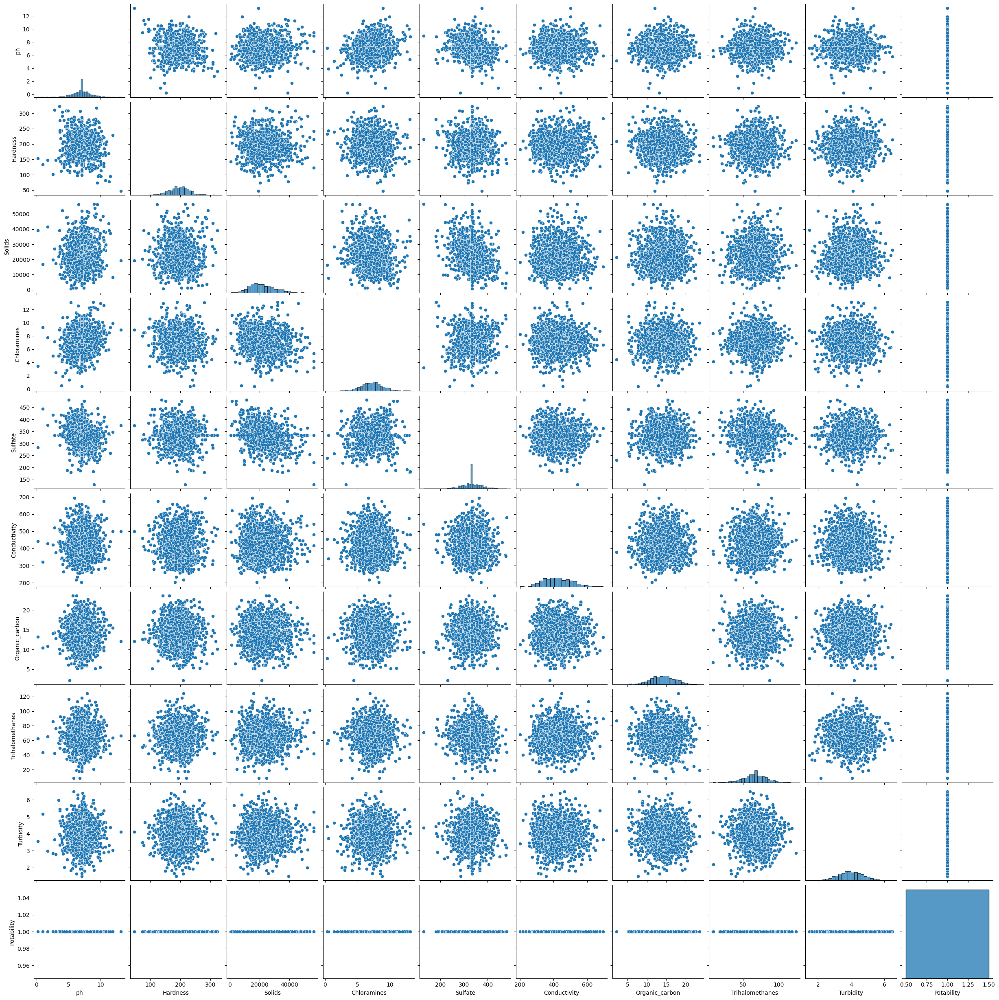

In [ ]:
positive = df[df['Potability'] == 1]
sns.pairplot(positive)

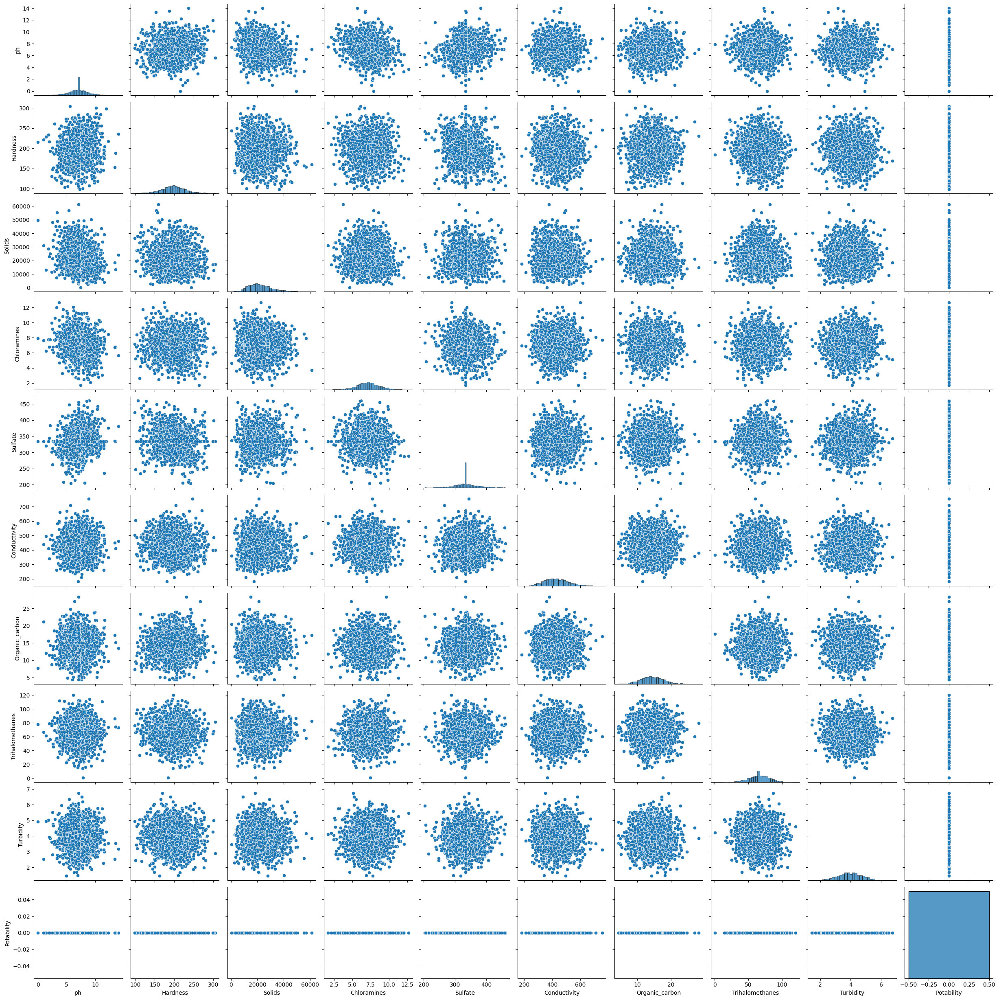

In [ ]:
negative = df[df['Potability'] == 0]
sns.pairplot(negative)

ALGORITHMS

In [ ]:
#Spliting the Data
X = df.drop('Potability', axis=1)
Y = df['Potability']
X_stscale = StandardScaler().fit_transform(X)

KNN

In [ ]:
#training the KNN model and predicting the classes
X_stscale_df = pd.DataFrame(X_stscale , index=X.index, columns=X.columns)
x_train, x_test, y_train, y_test = train_test_split(X_stscale_df,Y,test_size=0.3, random_state =1)
knn_clf = KNeighborsClassifier(n_neighbors =5,p=2,metric='minkowski')
knn_clf.fit(x_train,y_train)

KNeighborsClassifier()

Hyperparamter in KNN is

k: nearest neigbors which we compute while training the model. default:5
p: Power parameter for the minkowski metric. When p = 1, this is equivalent to using manhattan_distance,and euclidean_distance for p = 2.(default = 2)
metric: str or callable, default=’minkowski’.The distance metric to use for the tree. The default metric is minkowski, and with p=2 is equivalent to the standard Euclidean metric.

Result 1

In [ ]:
#training the KNN model and predicting the classes
X_stscale_df = pd.DataFrame(X_stscale, index=X.index, columns=X.columns)
x_train, x_test, y_train, y_test = train_test_split(X_stscale_df,Y,test_size=0.3, random_state =1)
knn_clf = KNeighborsClassifier(n_neighbors = 3,p=2,metric='minkowski')
knn_clf.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
#printing the accuracy and all other scores
print("Train Accuracy : ", 100*(round(accuracy_score(y_train,knn_clf.predict(x_train)),5)))
print("Test Accuracy : ", 100*(round(accuracy_score(y_test,knn_clf.predict(x_test)),5)))
result = confusion_matrix(y_test, knn_clf.predict(x_test))
print("Confusion Matrix:")
print(result)
print("Classification Report : \n", classification_report(y_test, knn_clf.predict(x_test)))

Train Accuracy :  81.116
Test Accuracy :  61.75000000000001
Confusion Matrix:
[[423 162]
 [214 184]]
Classification Report : 
               precision    recall  f1-score   support

           0       0.66      0.72      0.69       585
           1       0.53      0.46      0.49       398

    accuracy                           0.62       983
   macro avg       0.60      0.59      0.59       983
weighted avg       0.61      0.62      0.61       983



RESULT 2

In [ ]:
#training the KNN model and predicting the classes
X_stscale_df = pd.DataFrame(X_stscale, index=X.index, columns=X.columns)
x_train, x_test, y_train, y_test = train_test_split(X_stscale_df,Y,test_size=0.3, random_state =1)
knn_clf = KNeighborsClassifier(n_neighbors = 2,p=1,metric='minkowski')
knn_clf.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=2, p=1)

In [ ]:
#printing the accuracy and all other scores
print("Train Accuracy : ", 100*(round(accuracy_score(y_train,knn_clf.predict(x_train)),5)))
print("Test Accuracy : ", 100*(round(accuracy_score(y_test,knn_clf.predict(x_test)),5)))
result = confusion_matrix(y_test, knn_clf.predict(x_test))
print("Confusion Matrix:")
print(result)
print("Classification Report : \n", classification_report(y_test, knn_clf.predict(x_test)))

Train Accuracy :  79.765
Test Accuracy :  61.953
Confusion Matrix:
[[512  73]
 [301  97]]
Classification Report : 
               precision    recall  f1-score   support

           0       0.63      0.88      0.73       585
           1       0.57      0.24      0.34       398

    accuracy                           0.62       983
   macro avg       0.60      0.56      0.54       983
weighted avg       0.61      0.62      0.57       983



DecisionTreeClassifier

Hyperparamter in Decision Tree is criterion: The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain. (default='gini')
max_depth: Max_depth is one of the most important parameters is max_depth. It captures the essence of how deep the tree can get. More depth in the tree means that it is able to extract more information from the features. However, sometimes, excessive depth might be a cause of worry as it tends to bring along overfitting as well.(default = 'None')
splitter: The strategy used to choose the split at each node. Supported strategies are “best” to choose the best split and “random” to choose the best random split.(default='best')
RESULT 1

Result 1

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Create the DecisionTreeClassifier object with specified parameters
clf = DecisionTreeClassifier(criterion='entropy', max_depth=3, splitter='best')

# Fit the model on the training data
clf.fit(x_train, y_train)

# Predict on the test set
y_pred = clf.predict(x_test)

# Calculate and print the accuracy on the training set
acc_train = round(clf.score(x_train, y_train) * 100, 2)
print("Training Accuracy:", acc_train)

# Calculate and print the accuracy on the test set
acc_test = round(clf.score(x_test, y_test) * 100, 2)
print("Test Accuracy:", acc_test)


Training Accuracy: 66.68
Test Accuracy: 62.97


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Define the parameter grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7, 10, None],
    'splitter': ['best', 'random']
}

# Create the DecisionTreeClassifier object
clf = DecisionTreeClassifier()

# Set up the GridSearchCV
grid_search = GridSearchCV(estimator=clf, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model
grid_search.fit(x_train, y_train)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Accuracy Score (Cross-Validation):", grid_search.best_score_)


Best Parameters: {'criterion': 'entropy', 'max_depth': 3, 'splitter': 'best'}
Best Accuracy Score (Cross-Validation): 0.6502354653651853


Result2

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix

# Create the DecisionTreeClassifier object with specified parameters
clf = DecisionTreeClassifier(criterion='entropy', max_depth=12, splitter='random')

# Fit the model on the training data
clf.fit(x_train, y_train)

# Predict on the test set
y_pred = clf.predict(x_test)

# Calculate and print the accuracy on the training set
acc_train = round(clf.score(x_train, y_train) * 100, 2)
print("Training Accuracy:", acc_train)

# Calculate and print the accuracy on the test set
acc_test = round(clf.score(x_test, y_test) * 100, 2)
print("Test Accuracy:", acc_test)

result = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(result)
print("Classification Report : \n", classification_report(y_test, y_pred))


Training Accuracy: 74.14
Test Accuracy: 63.68
Confusion Matrix:
[[527  58]
 [299  99]]
Classification Report : 
               precision    recall  f1-score   support

           0       0.64      0.90      0.75       585
           1       0.63      0.25      0.36       398

    accuracy                           0.64       983
   macro avg       0.63      0.57      0.55       983
weighted avg       0.64      0.64      0.59       983



In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix

# Create the DecisionTreeClassifier object with specified parameters
clf = DecisionTreeClassifier(criterion='entropy', max_depth=12, splitter='best')

# Fit the model on the training data
clf.fit(x_train, y_train)

# Predict on the test set
y_pred = clf.predict(x_test)

# Calculate and print the accuracy on the training set
acc_train = round(clf.score(x_train, y_train) * 100, 2)
print("Training Accuracy:", acc_train)

# Calculate and print the accuracy on the test set
acc_test = round(clf.score(x_test, y_test) * 100, 2)
print("Test Accuracy:", acc_test)

result = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(result)
print("Classification Report : \n", classification_report(y_test, y_pred))


Training Accuracy: 78.59
Test Accuracy: 63.58
Confusion Matrix:
[[525  60]
 [298 100]]
Classification Report : 
               precision    recall  f1-score   support

           0       0.64      0.90      0.75       585
           1       0.62      0.25      0.36       398

    accuracy                           0.64       983
   macro avg       0.63      0.57      0.55       983
weighted avg       0.63      0.64      0.59       983



RANDOM FOREST IMPLEMENTATION
Hyperparamter in Random Forest is

criterion: The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain. (default='gini')
max_depth: Max_depth is one of the most important parameters is max_depth. It captures the essence of how deep the tree can get. More depth in the tree means that it is able to extract more information from the features. However, sometimes, excessive depth might be a cause of worry as it tends to bring along overfitting as well.(default = 'None')
n_estimators: n_estimators is the parameter used here to predict accuracy, it is the number of trees in the foreset.(default = 100)
RESULT 1

In [ ]:
#Training randomForestClassifier
Classifier = RandomForestClassifier(n_estimators=150, criterion='entropy', max_depth=10)
Classifier.fit(x_train, y_train)
rf_pred = Classifier.predict(x_test)

In [ ]:
#Confusion Metrics of randomForestClassifier
result = confusion_matrix(y_test, rf_pred)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, rf_pred)
print("Classification Report:",)
print (result1)
result2 = accuracy_score(y_test,rf_pred)*100
print("Accuracy:",result2)

Confusion Matrix:
[[548  37]
 [315  83]]
Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.94      0.76       585
           1       0.69      0.21      0.32       398

    accuracy                           0.64       983
   macro avg       0.66      0.57      0.54       983
weighted avg       0.66      0.64      0.58       983

Accuracy: 64.1912512716175


Result2

In [ ]:
#Training randomForestClassifier
Classifier = RandomForestClassifier(n_estimators=500, criterion='entropy', max_depth=8)
Classifier.fit(x_train, y_train)
rf_pred = Classifier.predict(x_test)

In [ ]:
#Confusion Metrics of randomForestClassifier
result = confusion_matrix(y_test, rf_pred)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, rf_pred)
print("Classification Report:",)
print (result1)
result2 = accuracy_score(y_test,rf_pred)*100
print("Accuracy:",result2)

Confusion Matrix:
[[556  29]
 [321  77]]
Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.95      0.76       585
           1       0.73      0.19      0.31       398

    accuracy                           0.64       983
   macro avg       0.68      0.57      0.53       983
weighted avg       0.67      0.64      0.58       983

Accuracy: 64.39471007121058


Result3

In [ ]:
#Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators = 100,criterion='entropy',max_depth = None)
clf.fit(x_train, y_train)
rf_pred = classifier.predict(x_test)

In [ ]:
#Confusion Mtrics of Random Forest Classifier
result = confusion_matrix(y_test, rf_pred)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, rf_pred)
print("Classification Report:",)
print (result1)
result2 = accuracy_score(y_test,rf_pred)*100
print("Accuracy:",result2)

Confusion Matrix:
[[531  54]
 [289 109]]
Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.91      0.76       585
           1       0.67      0.27      0.39       398

    accuracy                           0.65       983
   macro avg       0.66      0.59      0.57       983
weighted avg       0.66      0.65      0.61       983

Accuracy: 65.10681586978637



Hyperparamter in Logistic Regression is

n_jobs: n_jobs specifies the number of CPU cores used for key machine learning tasks.(default:None, Maximum number of iterations taken for the solvers to converge.)
max_depth: max_depth: Indicates how deep the tree can be. The deeper the tree, the more splits it has and it captures more information about the data. (Default value is none i.e. nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples)
random_state: Random state ensures that the splits that you generate are reproducible. The random state that you provide is used as a seed to the random number generator. This ensures that the random numbers are generated in the same order.(default=None)

Result1

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
#training the lr model
lr_model = LogisticRegression(max_iter=100,random_state=1,n_jobs=10)
lr_model.fit(x_train,y_train)
lr_pred =lr_model.predict(x_test)

In [ ]:
#testing and traing scoors
acc_log = round(lr_model.score(x_train, y_train) * 100, 2)
lr = 100*(accuracy_score(y_test, lr_pred))
print("Train Accuracy: " ,acc_log)
print("Test Accuracy: " + str(lr))
result = confusion_matrix(y_test,lr_pred)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, lr_pred)
print("Classification Report:",)
print (result1)

Train Accuracy:  61.58
Test Accuracy: 59.5116988809766
Confusion Matrix:
[[585   0]
 [398   0]]
Classification Report:
              precision    recall  f1-score   support

           0       0.60      1.00      0.75       585
           1       0.00      0.00      0.00       398

    accuracy                           0.60       983
   macro avg       0.30      0.50      0.37       983
weighted avg       0.35      0.60      0.44       983



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Result2

In [ ]:
#testing and traing scoors
lr_model = LogisticRegression(max_iter=120,random_state=0,n_jobs=20)
lr_model.fit(x_train,y_train)
lr_pred =lr_model.predict(x_test)
acc_log = round(lr_model.score(x_train, y_train) * 100, 2)
lr = 100*(accuracy_score(y_test, lr_pred))
print("Train Accuracy: " ,acc_log)
print("Test Accuracy: " + str(lr))
result = confusion_matrix(y_test,lr_pred)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, lr_pred)
print("Classification Report:",)
print (result1)


Train Accuracy:  61.58
Test Accuracy: 59.5116988809766
Confusion Matrix:
[[585   0]
 [398   0]]
Classification Report:
              precision    recall  f1-score   support

           0       0.60      1.00      0.75       585
           1       0.00      0.00      0.00       398

    accuracy                           0.60       983
   macro avg       0.30      0.50      0.37       983
weighted avg       0.35      0.60      0.44       983



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


SVM: SUPPORT VECTOR MACHINE IMPLEMENTATION


Hyperparamter in SVM is

kernel: In the code below, we have used kernel='rbf', as here we are creating SVM for non-linear data. Gaussian Radial Basis Function (RBF)
One of the most powerful and commonly used kernels in SVMs. Usually the choice for non-linear data.
This type of model uses the kernel of the normal (or Gaussian) probability density function (PDF) as the basis function. In this, basis function determines the spacing between the different basis functions that combine to form the model

In [ ]:
# Import necessary libraries
from sklearn import svm
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Initialize the SVM classifier with an RBF kernel
classifier1 = svm.SVC(kernel='rbf')

# Fit the classifier on the training data
classifier1.fit(x_train, y_train)

# Predict on the training data
x_train_prediction = classifier1.predict(x_train)
training_data_accuracy = accuracy_score(y_train, x_train_prediction) * 100
print('Accuracy on training data:', training_data_accuracy)

# Predict on the test data
x_test_prediction = classifier1.predict(x_test)
test_data_accuracy = accuracy_score(y_test, x_test_prediction) * 100
print('Accuracy on test data:', test_data_accuracy)

# Compute and print the confusion matrix
result = confusion_matrix(y_test, x_test_prediction)
print("Confusion Matrix:")
print(result)

# Compute and print the classification report
result1 = classification_report(y_test, x_test_prediction)
print("Classification Report:")
print(result1)


Accuracy on training data: 73.35368512865243
Accuracy on test data: 66.63275686673448
Confusion Matrix:
[[540  45]
 [283 115]]
Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.92      0.77       585
           1       0.72      0.29      0.41       398

    accuracy                           0.67       983
   macro avg       0.69      0.61      0.59       983
weighted avg       0.68      0.67      0.62       983



XGBOOST
Hyperparameters in XGBoost:

learning_rate: It’s a regularization parameter. Shrinks feature weights in each boosting step. (Can range from 0-1; increases accuracy when increased)
max_depth: Maximum tree depth. (Can range from 0-infinity; increases accuracy when increased)
n_estimators: Number of trees boosted. (Can range from 1-infinity; decreases accuracy when increased; default value = 100)
scale_pos_weight: Dealing with imbalanced data. (increases accuracy when increased)
RESULT 1

In [ ]:
# training the XGBClassifier
xgb_model = xgb.XGBClassifier(learning_rate=0.001,
                            max_depth =5,
                            n_estimators = 100,
                              scale_pos_weight=2)
xgb_model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.001, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
# Accuracy on traning testing
preds = xgb_model.score(x_train, y_train)
print("Accuracy on traning data : ", preds*100 )
preds1 = xgb_model.score(x_test, y_test)
print("Accuracy on testing data : ", preds1*100 )

Accuracy on traning data :  38.37767117313563
Accuracy on testing data :  40.4883011190234


In [ ]:
# training the XGBClassifier
xgb_model = xgb.XGBClassifier(learning_rate=0.01,
                            max_depth =20,
                            n_estimators = 80,
                              scale_pos_weight=5)
xgb_model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=20, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=80, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

Resut2

In [ ]:
# training the XGBClassifier
preds = xgb_model.score(x_train, y_train)
print("Accuracy on traning data : ", preds*100 )
preds1 = xgb_model.score(x_test, y_test)
print("Accuracy on testing data : ", preds1*100 )

Accuracy on traning data :  71.3475795900567
Accuracy on testing data :  47.4059003051882


Deployment

In [ ]:
import numpy as np  # Import NumPy for numerical operations

# Convert input data into a NumPy array and reshape it for model input
input_data = (5, 166, 72, 19, 175, 25.8, 0.587, 51, 11)
input_data_as_numpy_array = np.array(input_data).reshape(1, -1)

print(input_data_as_numpy_array)  # Output: [[  5.   166.   72.   19.  175.  25.8  0.587 51.  11.]]


[  5.    166.     72.     19.    175.     25.8     0.587  51.     11.   ]
[[  5.    166.     72.     19.    175.     25.8     0.587  51.     11.   ]]


In [ ]:
# Make a prediction using the trained classifier on the reshaped input data
prediction = classifier1.predict(input_data_as_numpy_array)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


array([0])

In [ ]:
# Make a prediction using the trained classifier, print the prediction, and determine potability based on the result
prediction = classifier1.predict(input_data_as_numpy_array)
print(prediction)

if prediction[0] == 0:
    print('Water is not Potable')
else:
    print('Water is Potable')


[0]
Water is not Potable


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


In [ ]:
# Save the trained classifier to a file using pickle for future use
filename = 'water_potability_model.sav'
pickle.dump(classifier1, open(filename, 'wb'))


In [ ]:
# Load the trained classifier from the file using pickle
loaded_model = pickle.load(open(filename, 'rb'))


In [ ]:
import numpy as np
import pickle

# Step 1: Define the input data representing water quality parameters
input_data = (5, 166, 72, 19, 175, 25.8, 0.587, 51, 11)

# Step 2: Convert the input data into a NumPy array
input_data_as_numpy_array = np.array(input_data)

# Step 3: Reshape the array to ensure it has the correct dimensions for model input
input_data_as_numpy_array = input_data_as_numpy_array.reshape(1, -1)

# Step 4: Make a prediction using the loaded model
prediction = loaded_model.predict(input_data_as_numpy_array)
print(prediction)  # Print the prediction result

# Step 5: Determine and print whether the water is potable based on the prediction
if prediction[0] == 0:
    print('Water is not Potable')
else:
    print('Water is Potable')


[0]
Water is not Potable


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


RESULT
From the results obtained, Support Vector Machine is a preferable method. It did not suffer the condition of overfitting and performed well when there is a clear indication of separation between classes. SVM Classifier in comparison to other classifiers have better computational complexity and even if the number of positive and negative examples are not same, SVM has the ability to normalize the data or to project into the space of the decision boundary separating the two classes. Other reason to say that SVM is better than other algorithms is the reason that it can also perform in n-Dimensional space. Random Forest performed well, however it shows overfitting, hence it isn’t preferred.

CONCLUSION
After experimenting and trying out different algorithms the conclusion drawn was that “pH” is the attribute which majorly affects the quality of water samples

 1 KNN-K Nearest Neighbor	Train: 79.459 , Test:62.055
 2 Decision tree	Train: 78.59 , Test:63.58
Random Forest	Train: 100 , Test: 66.429
Naive Bayes	Train: 63.28 , Test:100
Logistic Regression	Train: 61.58 , Test:59.51
SVM- Support Vector Machine	Train: 73.222 , Test:66.63
Stochastic Gradient Descent	Train: 61.27, Test:100.0
XGBoost	Train: 70.61, Test:63.48